# EDA on Zomato dataset


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [4]:
#checking version of libraries
pd.__version__



'2.1.4'

In [5]:
np.__version__

'1.26.4'

In [6]:
sns.__version__

'0.12.2'

In [172]:
# read files
df_zomato=pd.read_csv('zomato.csv',encoding='latin1')
df_zomato2=pd.read_csv('zomato.csv',encoding='latin1')
df_countrycode=pd.read_excel('Country-Code.xlsx')

In [8]:
df_zomato.head()


,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [9]:
df_countrycode.head()

,Country Code,Country
0,1,India
1,14,Australia
2,30,Brazil
3,37,Canada
4,94,Indonesia


In [10]:
#viewing name of all columns
df_zomato.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

In [11]:
df_zomato.shape

(9551, 21)

In [12]:
df_zomato.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [13]:
#removing some unwanted columns
df_zomato.drop(columns=['Longitude','Latitude','Restaurant ID','Address','Locality Verbose'],axis=1,inplace=True)

In [14]:
df_zomato

,Restaurant Name,Country Code,City,Locality,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,Le Petit Souffle,162,Makati City,"Century City Mall, Poblacion, Makati City","French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,Izakaya Kikufuji,162,Makati City,"Little Tokyo, Legaspi Village, Makati City",Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, Ortigas, Mandaluyong City","Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,Ooma,162,Mandaluyong City,"SM Megamall, Ortigas, Mandaluyong City","Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,Sambo Kojin,162,Mandaluyong City,"SM Megamall, Ortigas, Mandaluyong City","Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,NamlÛ± Gurme,208,ÛÁstanbul,Karakí_y,Turkish,80,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,Ceviz AÛôacÛ±,208,ÛÁstanbul,Koôuyolu,"World Cuisine, Patisserie, Cafe",105,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,Huqqa,208,ÛÁstanbul,Kuruí_eôme,"Italian, World Cuisine",170,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,Aôôk Kahve,208,ÛÁstanbul,Kuruí_eôme,Restaurant Cafe,120,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [15]:
df_zomato.columns

Index(['Restaurant Name', 'Country Code', 'City', 'Locality', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

In [16]:

df_zomato.describe()

,Country Code,Average Cost for two,Price range,Aggregate rating,Votes
count,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,18.365616,1199.210763,1.804837,2.666370,156.909748
std,56.750546,16121.183073,0.905609,1.516378,430.169145
min,1.000000,0.000000,1.000000,0.000000,0.000000
25%,1.000000,250.000000,1.000000,2.500000,5.000000
50%,1.000000,400.000000,2.000000,3.200000,31.000000
75%,1.000000,700.000000,2.000000,3.700000,131.000000
max,216.000000,800000.000000,4.000000,4.900000,10934.000000


In [17]:
#seperationg out int and float type numeric data
numeric_df = df_zomato.select_dtypes(include=['int64', 'float64'])

<Axes: >

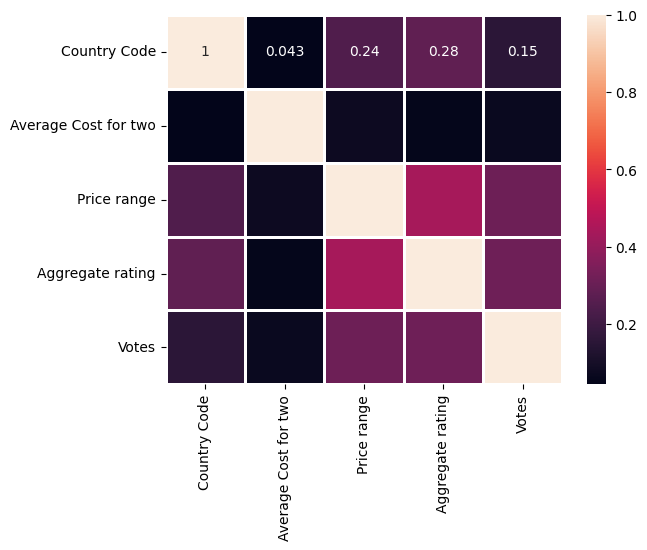

In [195]:
#plotting a correlation heatmap for numeric data 
sns.heatmap(numeric_df.corr(),
           annot=True,
           linewidths=1)

In [19]:
  #checking missing values 
df_zomato.isnull().sum()

Restaurant Name         0
Country Code            0
City                    0
Locality                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

In [20]:
#missing values in terms of percentage
perc_missingdata=df_zomato.isnull().sum()*100/len(df_zomato)
perc_missingdata

Restaurant Name         0.000000
Country Code            0.000000
City                    0.000000
Locality                0.000000
Cuisines                0.094231
Average Cost for two    0.000000
Currency                0.000000
Has Table booking       0.000000
Has Online delivery     0.000000
Is delivering now       0.000000
Switch to order menu    0.000000
Price range             0.000000
Aggregate rating        0.000000
Rating color            0.000000
Rating text             0.000000
Votes                   0.000000
dtype: float64

In [21]:
missing_df=pd.DataFrame({'variables':df_zomato.columns,
                        'Percent_Missing':perc_missingdata})
missing_df.sort_values('Percent_Missing',inplace=True)

In [22]:
missing_df

,variables,Percent_Missing
Restaurant Name,Restaurant Name,0.000000
Country Code,Country Code,0.000000
City,City,0.000000
Locality,Locality,0.000000
Average Cost for two,Average Cost for two,0.000000
Currency,Currency,0.000000
Has Table booking,Has Table booking,0.000000
Has Online delivery,Has Online delivery,0.000000
Is delivering now,Is delivering now,0.000000
Switch to order menu,Switch to order menu,0.000000


In [23]:
#checking missing value for a particular column
df_zomato['Cuisines'].isnull().sum()

9

In [24]:
subset_df=df_zomato[['Aggregate rating','Rating color','Rating text','Votes']]
subset_df

,Aggregate rating,Rating color,Rating text,Votes
0,4.8,Dark Green,Excellent,314
1,4.5,Dark Green,Excellent,591
2,4.4,Green,Very Good,270
3,4.9,Dark Green,Excellent,365
4,4.8,Dark Green,Excellent,229
...,...,...,...,...
9546,4.1,Green,Very Good,788
9547,4.2,Green,Very Good,1034
9548,3.7,Yellow,Good,661
9549,4.0,Green,Very Good,901


In [25]:
subset_df['Rating color'].value_counts()

Rating color
Orange        3737
White         2148
Yellow        2100
Green         1079
Dark Green     301
Red            186
Name: count, dtype: int64

In [26]:
subset_df['Rating text'].value_counts()

Rating text
Average      3737
Not rated    2148
Good         2100
Very Good    1079
Excellent     301
Poor          186
Name: count, dtype: int64

In [27]:
df_zomato['Has Table booking'].value_counts()

Has Table booking
No     8393
Yes    1158
Name: count, dtype: int64

In [28]:
result_rating = subset_df.groupby('Rating color')[['Aggregate rating', 'Rating text']].aggregate(['min', 'max'])


In [29]:
result_rating

Aggregate rating      Rating text           
                          min  max         min        max
Rating color                                             
Dark Green                4.5  4.9   Excellent  Excellent
Green                     4.0  4.4   Very Good  Very Good
Orange                    2.5  3.4     Average    Average
Red                       1.8  2.4        Poor       Poor
White                     0.0  0.0   Not rated  Not rated
Yellow                    3.5  3.9        Good       Good

<Axes: xlabel='Aggregate rating'>

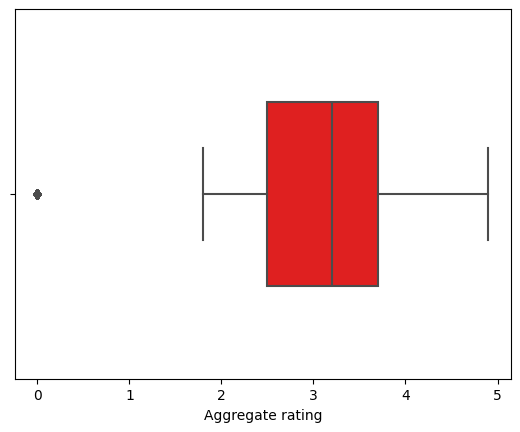

In [30]:
#boxplot
sns.boxplot(data=df_zomato,
           x='Aggregate rating',
           color='Red',
           width=0.5)

In [31]:
#75% of aggerate rating lie between 2.5 to 3.5

In [32]:
join_df=pd.merge(left=df_zomato,
                right=df_countrycode,
                left_on='Country Code',
                right_on='Country Code',
                how='inner')

In [33]:
join_df.head()

,Restaurant Name,Country Code,City,Locality,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
0,Le Petit Souffle,162,Makati City,"Century City Mall, Poblacion, Makati City","French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314,Phillipines
1,Izakaya Kikufuji,162,Makati City,"Little Tokyo, Legaspi Village, Makati City",Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591,Phillipines
2,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, Ortigas, Mandaluyong City","Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270,Phillipines
3,Ooma,162,Mandaluyong City,"SM Megamall, Ortigas, Mandaluyong City","Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365,Phillipines
4,Sambo Kojin,162,Mandaluyong City,"SM Megamall, Ortigas, Mandaluyong City","Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229,Phillipines


In [34]:
df_countrycode.head()

,Country Code,Country
0,1,India
1,14,Australia
2,30,Brazil
3,37,Canada
4,94,Indonesia


In [35]:
join_df.shape

(9551, 17)

In [36]:
currency_df=join_df.loc[:,['Country Code','Currency']]
currency_df.value_counts()

Country Code  Currency              
1             Indian Rupees(Rs.)        8652
216           Dollar($)                  434
215           Pounds(£)                  80
30            Brazilian Real(R$)          60
189           Rand(R)                     60
214           Emirati Diram(AED)          60
148           NewZealand($)               40
208           Turkish Lira(TL)            34
14            Dollar($)                   24
162           Botswana Pula(P)            22
94            Indonesian Rupiah(IDR)      21
166           Qatari Rial(QR)             20
184           Dollar($)                   20
191           Sri Lankan Rupee(LKR)       20
37            Dollar($)                    4
Name: count, dtype: int64

In [37]:
join_df['Has Online delivery'].value_counts()

Has Online delivery
No     7100
Yes    2451
Name: count, dtype: int64

In [38]:
#penetration percentage countrywise
perc_penetration=join_df.Country.value_counts()*100/len(join_df['Country'])

In [39]:
perc_penetration

Country
India             90.587373
United States      4.544027
United Kingdom     0.837609
Brazil             0.628206
UAE                0.628206
South Africa       0.628206
New Zealand        0.418804
Turkey             0.355984
Australia          0.251283
Phillipines        0.230342
Indonesia          0.219872
Singapore          0.209402
Qatar              0.209402
Sri Lanka          0.209402
Canada             0.041880
Name: count, dtype: float64

In [40]:
country_values=join_df.Country.value_counts().values
country_values

array([8652,  434,   80,   60,   60,   60,   40,   34,   24,   22,   21,
         20,   20,   20,    4], dtype=int64)

In [41]:
country_names=join_df.Country.value_counts().index
country_names

Index(['India', 'United States', 'United Kingdom', 'Brazil', 'UAE',
       'South Africa', 'New Zealand', 'Turkey', 'Australia', 'Phillipines',
       'Indonesia', 'Singapore', 'Qatar', 'Sri Lanka', 'Canada'],
      dtype='object', name='Country')

([<matplotlib.patches.Wedge at 0x22a5c57d410>,
 [Text(-1.0829742700952103, 0.19278674827836725, 'India'),
  Text(1.077281715838356, -0.22240527134123297, 'United States'),
  Text(1.0995865153823035, -0.03015783794312073, 'United Kingdom')],
 [Text(-0.590713238233751, 0.10515640815183668, '94.392%'),
  Text(0.5876082086391032, -0.12131196618612707, '4.735%'),
  Text(0.5997744629358018, -0.01644972978715676, '0.873%')])

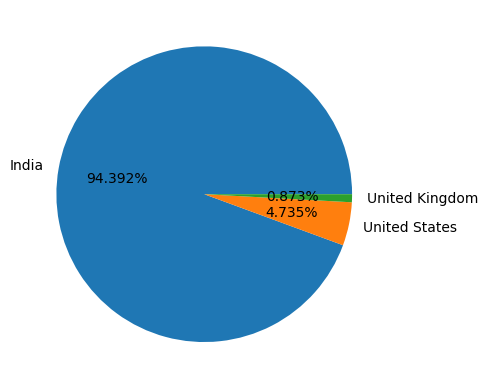

In [42]:
plt.pie(country_values[:3],labels=country_names[:3],autopct='%1.3f%%')

In [43]:
#country and online delivery
join_df.groupby(['Country','Has Online delivery']).size().reset_index()

,Country,Has Online delivery,0
0,Australia,No,24
1,Brazil,No,60
2,Canada,No,4
3,India,No,6229
4,India,Yes,2423
5,Indonesia,No,21
6,New Zealand,No,40
7,Phillipines,No,22
8,Qatar,No,20
9,Singapore,No,20


In [44]:
#which country has online delivery option in zomato
join_df[join_df['Has Online delivery']=='Yes'].Country.value_counts()

Country
India    2423
UAE        28
Name: count, dtype: int64

In [45]:
join_df[join_df['Has Online delivery']=='No'].Country.value_counts()

Country
India             6229
United States      434
United Kingdom      80
Brazil              60
South Africa        60
New Zealand         40
Turkey              34
UAE                 32
Australia           24
Phillipines         22
Indonesia           21
Singapore           20
Qatar               20
Sri Lanka           20
Canada               4
Name: count, dtype: int64

In [46]:
join_df.loc[join_df['Has Online delivery']=='Yes',['Country','Currency']].value_counts()

Country  Currency          
India    Indian Rupees(Rs.)    2423
UAE      Emirati Diram(AED)      28
Name: count, dtype: int64

In [47]:
join_df.loc[join_df['Has Online delivery']=='No',['Country','Currency']].value_counts()

Country         Currency              
India           Indian Rupees(Rs.)        6229
United States   Dollar($)                  434
United Kingdom  Pounds(£)                  80
Brazil          Brazilian Real(R$)          60
South Africa    Rand(R)                     60
New Zealand     NewZealand($)               40
Turkey          Turkish Lira(TL)            34
UAE             Emirati Diram(AED)          32
Australia       Dollar($)                   24
Phillipines     Botswana Pula(P)            22
Indonesia       Indonesian Rupiah(IDR)      21
Qatar           Qatari Rial(QR)             20
Singapore       Dollar($)                   20
Sri Lanka       Sri Lankan Rupee(LKR)       20
Canada          Dollar($)                    4
Name: count, dtype: int64

In [95]:
#data of indian restaurants
indian_cities=join_df[join_df['Country']=='India']

In [97]:
indian_cities


,Restaurant Name,Country Code,City,Locality,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
624,Jahanpanah,1,Agra,Agra Cantt,"North Indian, Mughlai",850,Indian Rupees(Rs.),No,No,No,No,3,3.9,Yellow,Good,140,India
625,Rangrezz Restaurant,1,Agra,Agra Cantt,"North Indian, Mughlai",700,Indian Rupees(Rs.),No,No,No,No,2,3.5,Yellow,Good,71,India
626,Time2Eat - Mama Chicken,1,Agra,Agra Cantt,North Indian,500,Indian Rupees(Rs.),No,No,No,No,2,3.6,Yellow,Good,94,India
627,Chokho Jeeman Marwari Jain Bhojanalya,1,Agra,Civil Lines,Rajasthani,400,Indian Rupees(Rs.),No,No,No,No,2,4.0,Green,Very Good,87,India
628,Pinch Of Spice,1,Agra,Civil Lines,"North Indian, Chinese, Mughlai",1000,Indian Rupees(Rs.),No,No,No,No,3,4.2,Green,Very Good,177,India
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9271,D Cabana,1,Vizag,Sagar Nagar,"Continental, Seafood, Chinese, North Indian, B...",600,Indian Rupees(Rs.),No,No,No,No,2,3.6,Yellow,Good,193,India
9272,Kaloreez,1,Vizag,Siripuram,"Cafe, North Indian, Chinese",400,Indian Rupees(Rs.),No,No,No,No,2,3.7,Yellow,Good,85,India
9273,Plot 17,1,Vizag,Siripuram,"Burger, Pizza, Biryani",600,Indian Rupees(Rs.),No,No,No,No,2,4.3,Green,Very Good,172,India
9274,Vista - The Park,1,Vizag,"The Park, Lawsons Bay","American, North Indian, Thai, Continental",1500,Indian Rupees(Rs.),No,No,No,No,4,3.8,Yellow,Good,74,India


In [99]:
indian_cities.shape

(8652, 17)

In [101]:
#viewing cities count
city_count=indian_cities['City'].value_counts()

In [103]:

city_count

City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Ahmedabad         21
Guwahati          21
Lucknow           21
Bhubaneshwar      21
Amritsar          21
Pune              20
Puducherry        20
Patna             20
Ludhiana          20
Ranchi            20
Surat             20
Vadodara          20
Nashik            20
Nagpur            20
Mysore            20
Mumbai            20
Varanasi          20
Mangalore         20
Agra              20
Kochi             20
Kolkata           20
Dehradun          20
Allahabad         20
Aurangabad        20
Bangalore         20
Bhopal            20
Chennai           20
Coimbatore        20
Goa               20
Indore            20
Jaipur            20
Kanpur            20
Vizag             20
Chandigarh        18
Hyderabad         18
Secunderabad       2
Panchkula          1
Mohali             1
Name: count, dtype: int64

In [105]:
#selecting first 5 cities from sorted city 
city_count[:5]

City
New Delhi    5473
Gurgaon      1118
Noida        1080
Faridabad     251
Ghaziabad      25
Name: count, dtype: int64

([<matplotlib.patches.Wedge at 0x22a5f282790>,
 [Text(-0.6836225695617262, 0.8617773392157762, 'New Delhi'),
  Text(0.24897482286810813, -1.0714530029720364, 'Gurgaon'),
  Text(0.9941442744692855, -0.47082604169686504, 'Noida')],
 [Text(-0.37288503794275973, 0.47006036684496877, '71.35%'),
  Text(0.13580444883714987, -0.5844289107120197, '14.57%'),
  Text(0.542260513346883, -0.25681420456192633, '14.08%')])

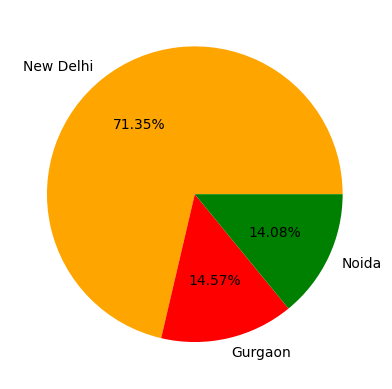

In [111]:
#plotting a pie chart for top 5 cities
plt.pie(city_count.values[:3],
       labels=city_count.index[:3],
       autopct='%1.2f%%',
       colors=['orange','red','green'])

C:\Users\Aditya\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


<Axes: xlabel='Rating color', ylabel='count'>

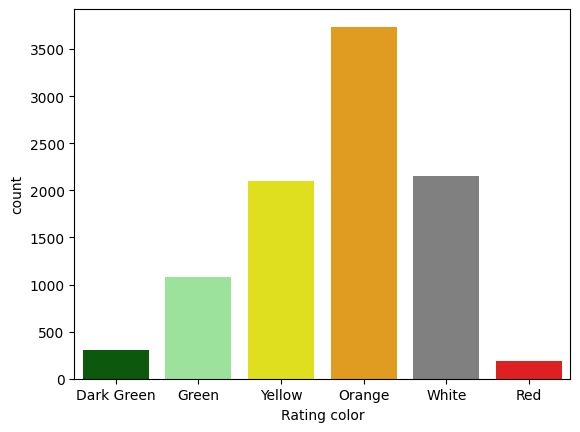

In [125]:
sns.countplot(
    data=join_df, 
    x='Rating color', 
    palette=palette, 
    order=['Dark Green', 'Green', 'Yellow', 'Orange', 'White', 'Red']
)

In [127]:
result_rating

Aggregate rating      Rating text           
                          min  max         min        max
Rating color                                             
Dark Green                4.5  4.9   Excellent  Excellent
Green                     4.0  4.4   Very Good  Very Good
Orange                    2.5  3.4     Average    Average
Red                       1.8  2.4        Poor       Poor
White                     0.0  0.0   Not rated  Not rated
Yellow                    3.5  3.9        Good       Good

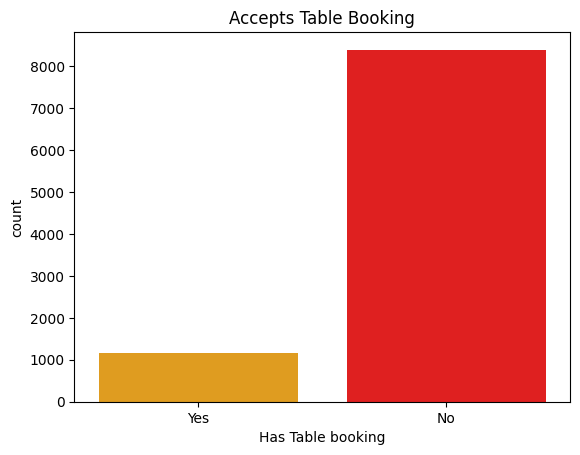

In [131]:
sns.countplot(data=join_df, x='Has Table booking', palette=['orange', 'red'])
plt.title('Accepts Table Booking')
plt.show()

In [141]:
#what is the avg cost for two as per country

join_df.groupby('Country')['Average Cost for two'].mean().sort_values(ascending=False).round(1)

Country
Indonesia         281190.5
Sri Lanka           2375.0
Phillipines         1606.8
India                623.4
South Africa         419.7
Qatar                223.8
UAE                  166.4
Singapore            155.8
Brazil               134.7
Turkey                84.9
New Zealand           69.8
United Kingdom        47.8
Canada                36.2
United States         26.2
Australia             24.1
Name: Average Cost for two, dtype: float64

In [145]:
#highest avg cost in indian cities

indian_cities.groupby('City')['Average Cost for two'].mean().sort_values(ascending=False)

City
Panchkula       2000.000000
Hyderabad       1361.111111
Pune            1337.500000
Jaipur          1310.000000
Kolkata         1272.500000
Bangalore       1232.500000
Goa             1175.000000
Ludhiana        1160.000000
Chennai         1085.000000
Mumbai          1072.500000
Chandigarh      1072.222222
Agra            1065.000000
Indore           960.000000
Kanpur           915.000000
Lucknow          859.523810
Ahmedabad        857.142857
Puducherry       842.500000
Secunderabad     825.000000
Guwahati         821.428571
Vadodara         820.000000
Mysore           814.500000
Surat            812.500000
Patna            797.500000
Mangalore        782.500000
Coimbatore       782.500000
Vizag            780.000000
Ranchi           735.000000
Kochi            730.000000
Dehradun         727.500000
Nagpur           715.000000
Gurgaon          714.016100
Bhubaneshwar     678.571429
Nashik           662.500000
Aurangabad       622.500000
Bhopal           620.000000
Ghaziabad      

In [147]:
#lowest 3 avg cost in indian cities

indian_cities.groupby('City')['Average Cost for two'].mean().sort_values(ascending=False)[-3:]

City
Varanasi     505.000000
Amritsar     480.952381
Faridabad    447.609562
Name: Average Cost for two, dtype: float64

In [155]:
join_df['Price range'] = join_df['Price range'].astype('category')


C:\Users\Aditya\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


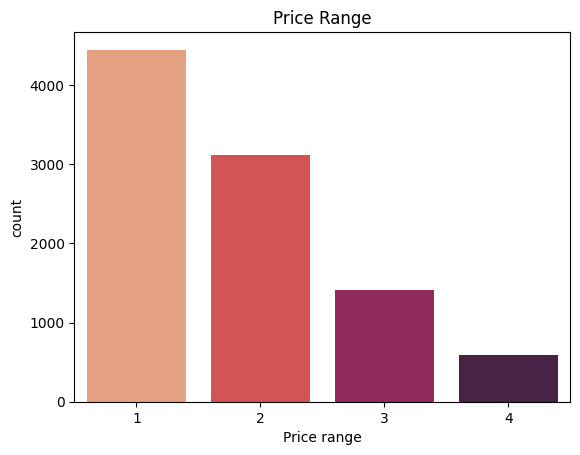

In [157]:
#viewing price range of restaurants, where 1 means less expensive and 4 means highly expensive
sns.countplot(data=join_df, x='Price range', palette='rocket_r', order=sorted(join_df['Price range'].unique()))
plt.title('Price Range')
plt.show()



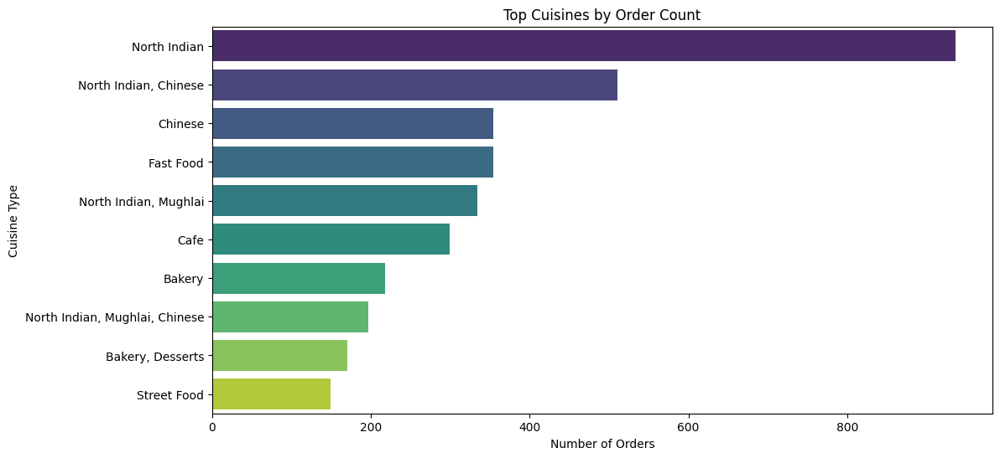

In [159]:
# Count the occurrences of each cuisine type
cuisine_counts = df_zomato['Cuisines'].value_counts().head(10)  # Displaying top 10 cuisines for clarity

# Plotting the data
plt.figure(figsize=(12, 6))
sns.barplot(x=cuisine_counts.values, y=cuisine_counts.index, palette='viridis')
plt.title('Top Cuisines by Order Count')
plt.xlabel('Number of Orders')
plt.ylabel('Cuisine Type')
plt.show()

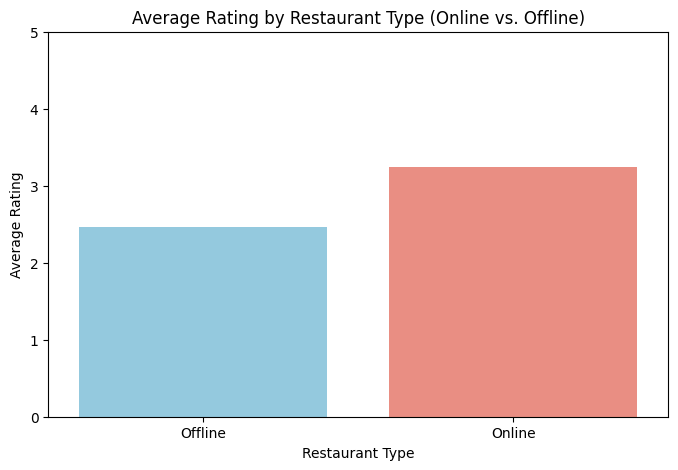

In [161]:
df_zomato['Has Online delivery'] = df_zomato['Has Online delivery'].replace({'Yes': 'Online', 'No': 'Offline'})

# Calculate average rating for online and offline restaurants
rating_by_type = df_zomato.groupby('Has Online delivery')['Aggregate rating'].mean()

# Plotting the data
plt.figure(figsize=(8, 5))
sns.barplot(x=rating_by_type.index, y=rating_by_type.values, palette=['skyblue', 'salmon'])
plt.title('Average Rating by Restaurant Type (Online vs. Offline)')
plt.xlabel('Restaurant Type')
plt.ylabel('Average Rating')
plt.ylim(0, 5)  # Assuming the rating scale is from 0 to 5
plt.show()

C:\Users\Aditya\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


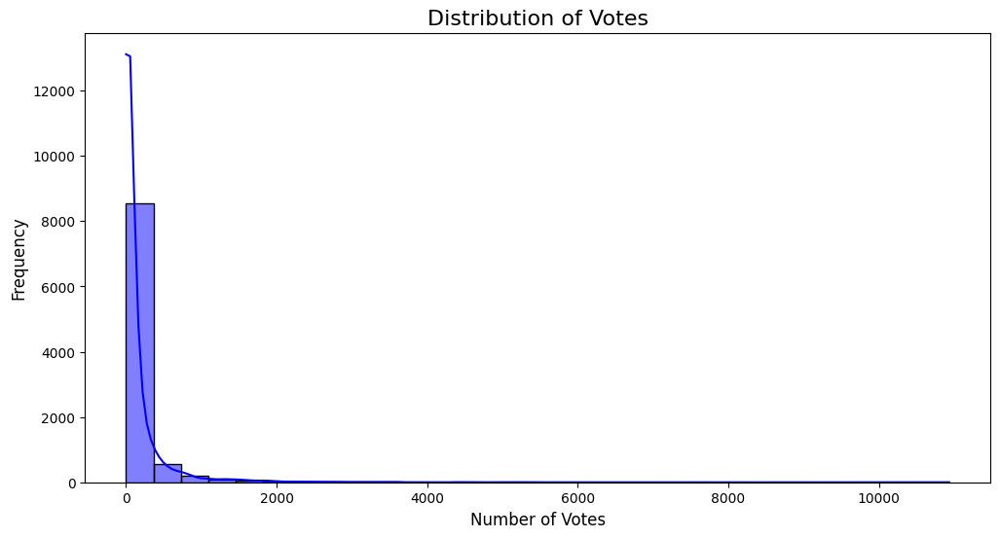

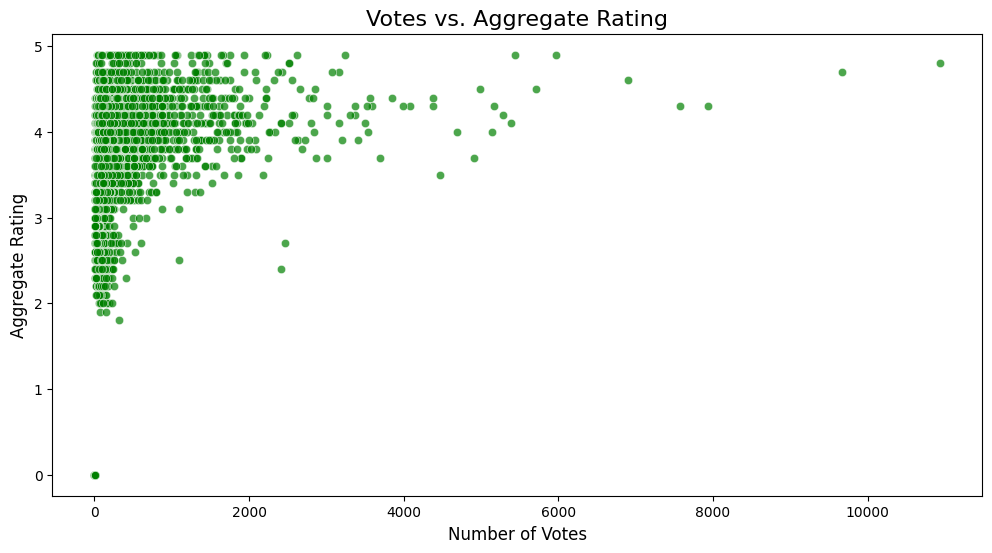

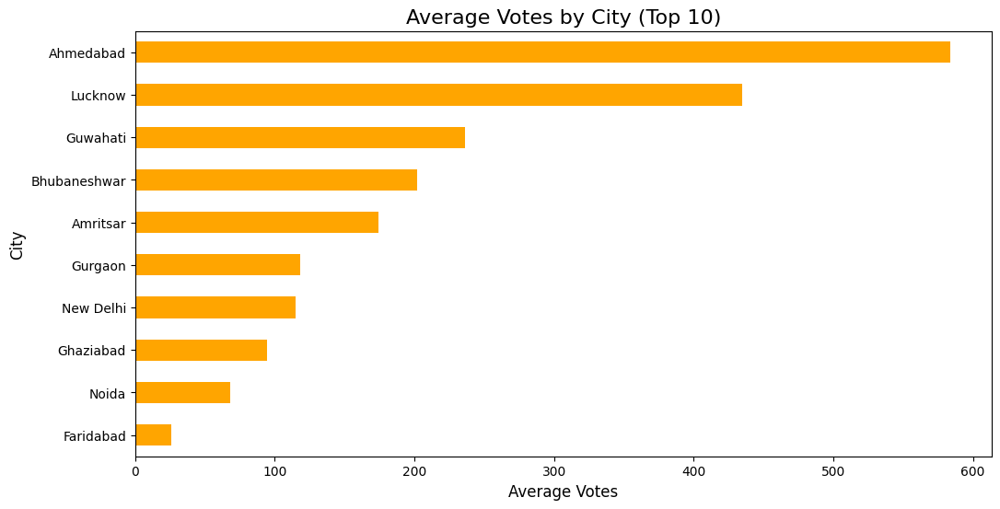

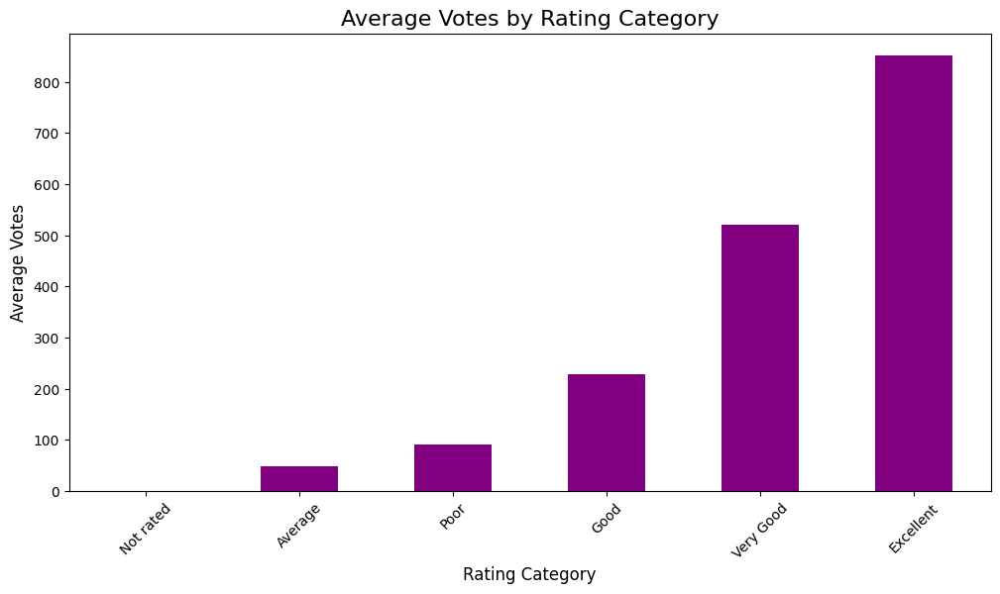

In [199]:


# 1. Distribution of Votes
plt.figure(figsize=(12, 6))
sns.histplot(df_zomato['Votes'], bins=30, kde=True, color='blue')
plt.title('Distribution of Votes', fontsize=16)
plt.xlabel('Number of Votes', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.show()

# 2. Votes vs. Aggregate Rating
plt.figure(figsize=(12, 6))
sns.scatterplot(x='Votes', y='Aggregate rating', data=df_zomato, alpha=0.7, color='green')
plt.title('Votes vs. Aggregate Rating', fontsize=16)
plt.xlabel('Number of Votes', fontsize=12)
plt.ylabel('Aggregate Rating', fontsize=12)
plt.show()

# 3. Average Votes by City
top_cities = df_zomato['City'].value_counts().nlargest(10).index  # Top 10 cities with most restaurants
city_votes = df_zomato[df_zomato['City'].isin(top_cities)].groupby('City')['Votes'].mean().sort_values()

plt.figure(figsize=(12, 6))
city_votes.plot(kind='barh', color='orange')
plt.title('Average Votes by City (Top 10)', fontsize=16)
plt.xlabel('Average Votes', fontsize=12)
plt.ylabel('City', fontsize=12)
plt.show()

# 4. Votes by Rating Categories
rating_category_votes = df_zomato.groupby('Rating text')['Votes'].mean().sort_values()

plt.figure(figsize=(12, 6))
rating_category_votes.plot(kind='bar', color='purple')
plt.title('Average Votes by Rating Category', fontsize=16)
plt.xlabel('Rating Category', fontsize=12)
plt.ylabel('Average Votes', fontsize=12)
plt.xticks(rotation=45)
plt.show()


In [176]:
# Initialize a map
cluster_map = folium.Map(location=[20, 0], zoom_start=2)

# Add clustered markers
marker_cluster = MarkerCluster().add_to(cluster_map)

for _, row in geo_data.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Restaurant: {row['Restaurant Name']}<br>City: {row['City']}<br>Rating: {row['Aggregate rating']}",
    ).add_to(marker_cluster)

# Save or display map
cluster_map.save('clustered_restaurants_map.html')
cluster_map


In [201]:
from folium.plugins import HeatMap

# Create heatmap data
heat_data = geo_data[['Latitude', 'Longitude']].values.tolist()

# Initialize a heatmap
heat_map = folium.Map(location=[20, 0], zoom_start=2)

# Add heatmap layer
HeatMap(heat_data, radius=10).add_to(heat_map)

# Save or display map
heat_map.save('heatmap_restaurants.html')
heat_map


In [182]:
# Top 10 Restaurants by Aggregate Rating
top_rated_restaurants = df_zomato[['Restaurant Name', 'City', 'Aggregate rating', 'Votes']].sort_values(
    by='Aggregate rating', ascending=False).head(10)

print("Top 10 Highly Rated Restaurants")
print(top_rated_restaurants)

# Top 10 Restaurants by Votes
most_voted_restaurants = df_zomato[['Restaurant Name', 'City', 'Aggregate rating', 'Votes']].sort_values(
    by='Votes', ascending=False).head(10)

print("Top 10 Most Voted Restaurants")
print(most_voted_restaurants)


Top 10 Highly Rated Restaurants
                    Restaurant Name            City  Aggregate rating  Votes
1381                    Caterspoint         Gurgaon               4.9    223
589         AB's Absolute Barbecues           Dubai               4.9    641
374   McGuire's Irish Pub & Brewery       Pensacola               4.9   2238
9303                          Miann        Auckland               4.9    281
9299                          Milse        Auckland               4.9    754
9296               Talaga Sampireun       Tangerang               4.9   2212
50                Garota de Ipanema  Rio de Janeiro               4.9     49
9291               Talaga Sampireun         Jakarta               4.9   1640
48               Braseiro da Gíçvea  Rio de Janeiro               4.9     40
428               Mama's Fish House  Rest of Hawaii               4.9   1343
Top 10 Most Voted Restaurants
                Restaurant Name       City  Aggregate rating  Votes
728                    

In [185]:
# Restaurants with the Lowest Ratings
low_rated_restaurants = df_zomato[['Restaurant Name', 'City', 'Aggregate rating', 'Votes']].sort_values(
    by='Aggregate rating', ascending=True).head(10)

print("Restaurants with the Lowest Ratings")
print(low_rated_restaurants)

# Restaurants with Low Ratings and Votes
low_performance = df_zomato[(df_zomato['Aggregate rating'] < 2.5) & (df_zomato['Votes'] < 50)]

print("Underperforming Restaurants")
print(low_performance[['Restaurant Name', 'City', 'Aggregate rating', 'Votes']])


Restaurants with the Lowest Ratings
            Restaurant Name       City  Aggregate rating  Votes
6615            LSK Express  New Delhi               0.0      1
1994             Apni Rasoi    Gurgaon               0.0      0
1995  Bala Ji Sweets Corner    Gurgaon               0.0      0
1996                Barista    Gurgaon               0.0      0
1997        Biryani Express    Gurgaon               0.0      1
1998          Cafe #22hours    Gurgaon               0.0      0
1999        Cake Innovation    Gurgaon               0.0      1
2000             Chawla's_    Gurgaon               0.0      1
2001        China Gathering    Gurgaon               0.0      1
2002    Chinese Hot Express    Gurgaon               0.0      0
Underperforming Restaurants
             Restaurant Name            City  Aggregate rating  Votes
30            Sandubas Cafí©       Brasí_lia               0.0      2
58     Quiosque Chopp Brahma  Rio de Janeiro               0.0      1
69          Cantinho d

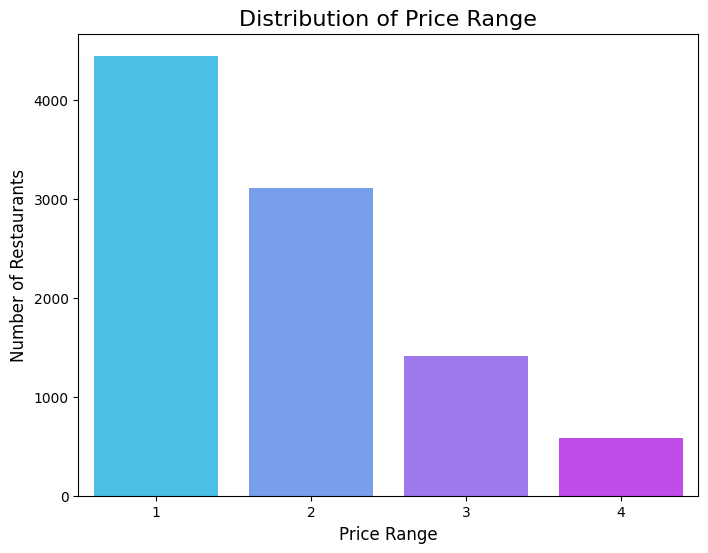

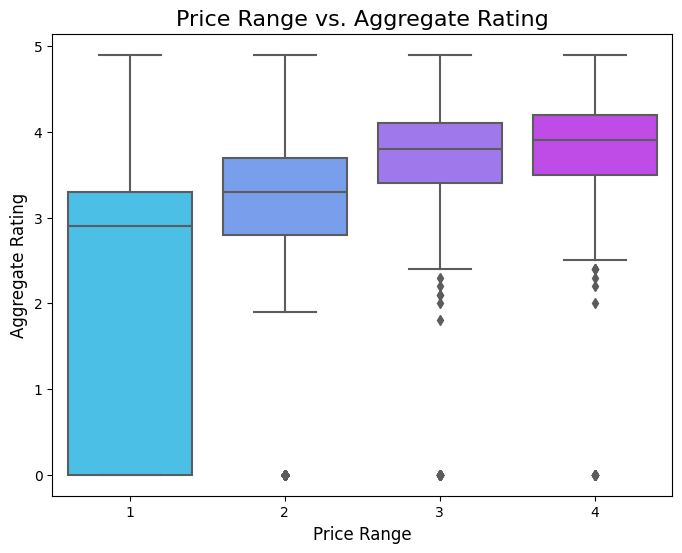

In [187]:
import seaborn as sns
import matplotlib.pyplot as plt

# Distribution of Price Range
plt.figure(figsize=(8, 6))
sns.countplot(x='Price range', data=df_zomato, palette='cool')
plt.title('Distribution of Price Range', fontsize=16)
plt.xlabel('Price Range', fontsize=12)
plt.ylabel('Number of Restaurants', fontsize=12)
plt.show()

# Price Range vs. Aggregate Rating
plt.figure(figsize=(8, 6))
sns.boxplot(x='Price range', y='Aggregate rating', data=df_zomato, palette='cool')
plt.title('Price Range vs. Aggregate Rating', fontsize=16)
plt.xlabel('Price Range', fontsize=12)
plt.ylabel('Aggregate Rating', fontsize=12)
plt.show()


Average Rating Based on Table Booking
Has Table booking
No     2.559359
Yes    3.441969
Name: Aggregate rating, dtype: float64
Average Rating Based on Online Delivery
Has Online delivery
No     2.465296
Yes    3.248837
Name: Aggregate rating, dtype: float64


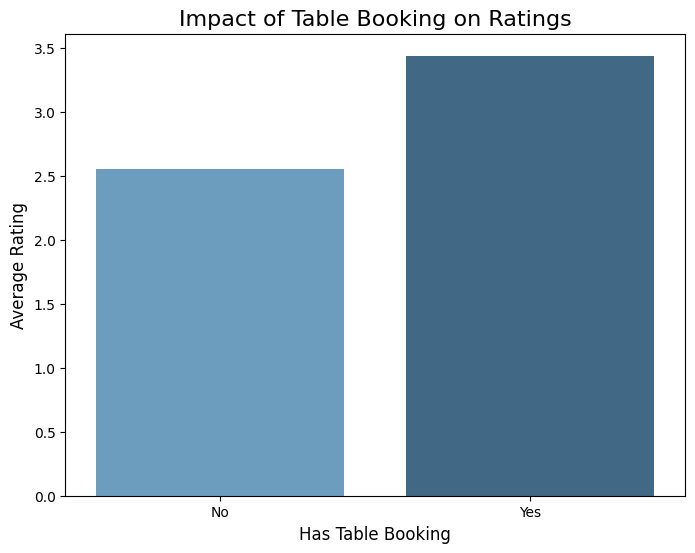

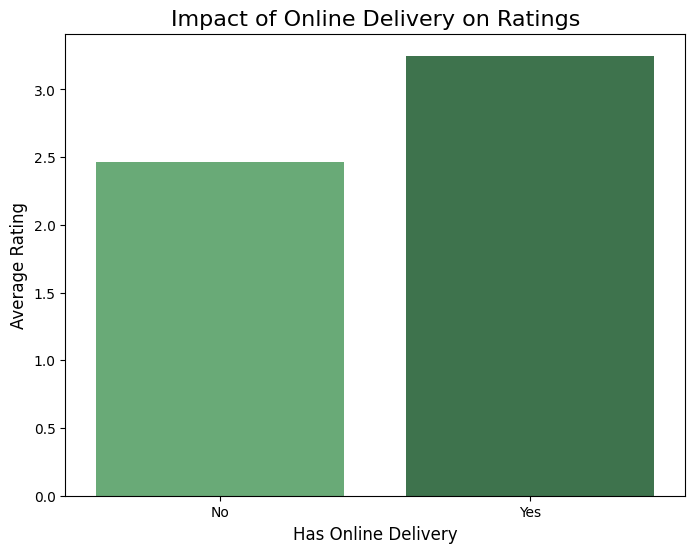

In [189]:
# Impact of Table Booking on Ratings
table_booking = df_zomato.groupby('Has Table booking')['Aggregate rating'].mean()

print("Average Rating Based on Table Booking")
print(table_booking)

# Impact of Online Delivery on Ratings
online_delivery = df_zomato.groupby('Has Online delivery')['Aggregate rating'].mean()

print("Average Rating Based on Online Delivery")
print(online_delivery)

# Visualization
plt.figure(figsize=(8, 6))
sns.barplot(x=table_booking.index, y=table_booking.values, palette='Blues_d')
plt.title('Impact of Table Booking on Ratings', fontsize=16)
plt.xlabel('Has Table Booking', fontsize=12)
plt.ylabel('Average Rating', fontsize=12)
plt.show()

plt.figure(figsize=(8, 6))
sns.barplot(x=online_delivery.index, y=online_delivery.values, palette='Greens_d')
plt.title('Impact of Online Delivery on Ratings', fontsize=16)
plt.xlabel('Has Online Delivery', fontsize=12)
plt.ylabel('Average Rating', fontsize=12)
plt.show()


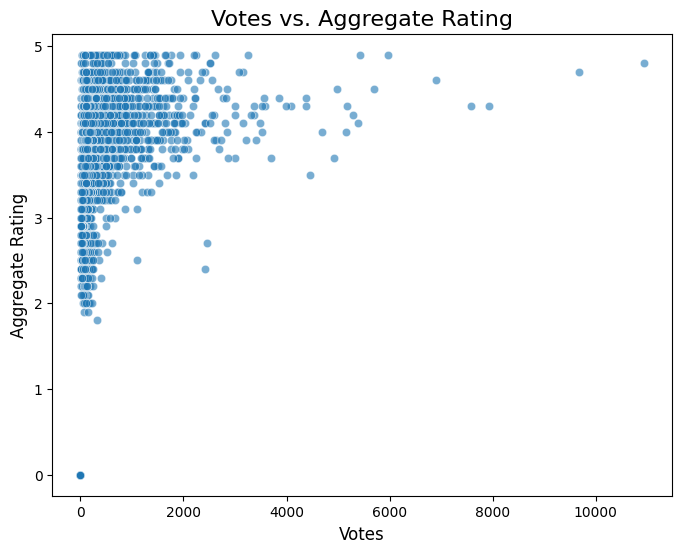

Average Votes by Price Range
Price range
1     44.597435
2    147.607131
3    443.860795
4    368.595563
Name: Votes, dtype: float64


In [191]:
# Relationship between Votes and Ratings
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Votes', y='Aggregate rating', data=df_zomato, alpha=0.6)
plt.title('Votes vs. Aggregate Rating', fontsize=16)
plt.xlabel('Votes', fontsize=12)
plt.ylabel('Aggregate Rating', fontsize=12)
plt.show()

# Average Votes by Price Range
avg_votes_by_price = df_zomato.groupby('Price range')['Votes'].mean()

print("Average Votes by Price Range")
print(avg_votes_by_price)


# Insights

In [ ]:
-majority (3737) ratings lie in 'Average /Orange' category

-94% restaurants are from india in this data set

-majority(6229) of restaurants in india do NOT offer online delivery

-very less restaurants offer table booking

-top 5 indian cities having highest number of restaurants are
New Delhi    5473
Gurgaon      1118
Noida        1080
Faridabad     251
Ghaziabad      25

-Top 3 countries with highest avg cost for 2 people are
Indonesia         281190.5
Sri Lanka           2375.0
Phillipines         1606.8

-top 3 countries with least cost avg for 2 people are
Canada                36.2
United States         26.2
Australia             24.1


-top 3 indian cities with highest avg cost for 2 people are
Panchkula       2000.000000
Hyderabad       1361.111111
Pune            1337.500000

- top 3 indian cities with lowest avg cost for 2 people are
Varanasi         505.000000
Amritsar         480.952381
Faridabad        447.609562

-high number of restaurants (>4000) lie in expensive category-1( i.e very less expensive), very less number of restaurants i.e <1000 lie in category-4(very expensive)


-most popular cusines are north indian followed by chinese

-average rating of restaurants having online delivery is higher(appx 3) as compared to those who does not offer online services(appx 2.5).

-average rating of restaurants offering table booking is higher as compared to those who does not offer table booking.

- meaning the majority of restaurants receive very few votes.
A small number of restaurants have a significantly high number of votes.


-There is a general trend that restaurants with a higher number of votes tend to have better aggregate ratings.Most restaurants have very few votes (cluster near the left side of the x-axis) regardless of their ratings, indicating that many restaurants struggle with customer engagement.

-top 3 voted cities are Ahemdabad,Lucknow,Guwahati


-excellent rated restaurants have highest number of votes

-Top 3 Highly Rated Restaurants

                    Restaurant Name     |      City  |Aggregate rating  |Votes
1381                    Caterspoint     |   Gurgaon  |             4.9  |  223
589         AB's Absolute Barbecues     |      Dubai |              4.9 |   641
374   McGuire's Irish Pub & Brewery     |  Pensacola |             4.9  | 2238


-Top 3 Most Voted Restaurants

                Restaurant Name|       City | Aggregate rating | Votes
728                        Toit|  Bangalore |              4.8 | 10934
735                    Truffles|  Bangalore |              4.7 |  9667
3994           Hauz Khas Social|  New Delhi |              4.3 |  7931
